In [2]:
import xarray as xr
import numpy as np
import gsw
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib as mpl
import cmocean
from matplotlib.animation import FuncAnimation
from matplotlib import animation
import ffmpeg
import pylab as pl
import pandas as pd
from math import radians, cos
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [3]:
project='realBathy'
ed='run7/'

directory='/Users/ameliameggo/Proyecto/Codigo/NGC/'+ str(project)
dataloc=str(directory)+ '/' + str(ed)
location= str(directory) + '/Files/' + str(ed) #'/Users/ameliaking/Proyecto/Codigo/Idealizada/ChangeDim/'

#location='/home/amelia/NGC/'+ str(project) + '/Files/' + str(ed) #'/Users/ameliaking/Proyecto/Codigo/Idealizada/ChangeDim/'

if project=='realBathy':
    if ed == 'run2/' or ed == 'run5/' or ed == 'run7/':
        ds=xr.open_dataset(str(location) + 'theta.nc')
        #dsrho=xr.open_dataset(str(location) + 'dynDiag.nc')
        dsVVEL=xr.open_dataset(str(location) + 'vvel.nc')
        dsWVEL=xr.open_dataset(str(location) + 'wvel.nc')
        dsUVEL=xr.open_dataset(str(location) + 'uvel.nc')
    elif ed == 'run7/':
        var='dynDiagDragBot'
        ds=xr.open_dataset(str(location) +  str(var) + '.nc')
    else:
        for i in np.arange(10,60,10):
            var='dynDiag'+str(i)
            if i==10:
                ds=xr.open_dataset(str(location) +  str(var) + '.nc')
            else:
                ds=ds.merge(xr.open_dataset(str(location) +  str(var) + '.nc'))
else:
    var='dynDiag'
    ds=xr.open_dataset(str(location) +  str(var) + '.nc')
    
#varT='THETA'

#dsT=xr.open_dataset(str(location) +  str(varT) + '.nc')

varS='surfDiag'

#dsS=xr.open_dataset(str(location) +  str(varS) + '.nc')

varG='grid'

dsG=xr.open_dataset(str(location) +  str(varG) + '.nc')


#Take them minus 1 and 2 to skip the boundary
ny=len(dsG.Y)
nx=len(dsG.X) 
nz=len(dsG.Z)
nt=len(ds.T) 

if project=='twoBumps' or project=='2tracers':
    umbral1=np.where(dsG.Depth[:int(ny/2),20].values==np.min(dsG.Depth[:int(ny/2),20].values))[0][int(len(np.where(dsG.Depth[:int(ny/2),20].values==np.min(dsG.Depth[:int(ny/2),20].values))[0])/2)]
    umbral2=np.where(dsG.Depth[int(ny/2):,20].values==np.min(dsG.Depth[int(ny/2):,20].values))[0][int(len(np.where(dsG.Depth[int(ny/2):,20].values==600)[0])/2)]+int(ny/2)

    umbralEnd1=np.where(dsG.Depth[:int(ny/2),20]<np.max(dsG.Depth[:int(ny/2),20]))[0][-1]
    umbralEnd2=np.where(dsG.Depth[int(ny/2):,20]<np.max(dsG.Depth[int(ny/2):,20]))[0][-1]+int(ny/2)
else:
    umbral=np.where(dsG.Depth[:-1,20].values==np.min(dsG.Depth[:-1,20].values))[0][int(len(np.where(dsG.Depth[:,20].values==np.min(dsG.Depth[:,20].values))[0])/2)]
    umbralEnd=np.where(dsG.Depth[:,20]<np.max(dsG.Depth[:,20]))[0][-1]

hFacC = dsG.HFacC

hfa = np.ma.masked_values(hFacC, 0)
mask = np.ma.getmask(hfa)

hFacW = dsG.HFacW

hfaW = np.ma.masked_values(hFacW, 0)
maskw = np.ma.getmask(hfaW)

hFacS = dsG.HFacS

hfaS = np.ma.masked_values(hFacS, 0)
masks = np.ma.getmask(hfaS)

#info=pd.read_csv(str(dataloc) + 'data',sep='/n')
#parameters=['viscAh','viscAr','diffKhT','diffKrT']


if project == '2Dsill':
    OB=1
    OBend=-1
elif project =='2DsillOB':
    OBp=1
    OBendp=-1
    OB=21
    OBend=-1
elif project =='OpenNorth' or project =='Orlanski':
    OBp=1
    OBendp=-1
    OB=10
    OBend=-10
    OBx=1
    OBendx=-1
else:
    OBp=1
    OBendp=-1
    OB=20
    OBend=-20
    OBx=1
    OBendx=-1

In [6]:
project='realBathy'
ed='run7/'

directory='/Users/ameliameggo/Proyecto/Codigo/NGC/'+ str(project)
dataloc=str(directory)+ '/' + str(ed)
location= str(directory) + '/Files/' + str(ed) #'/Users/ameliaking/Proyecto/Codigo/Idealizada/ChangeDim/'

dsDrag=xr.open_dataset(str(location) + 'dynDiagDrag.nc') #No Parameterization, Sidedragfactor=1, half slip, linear bottom drag 1e-3
dsDragBot=xr.open_dataset(str(location) + 'dynDiagDragBot.nc') #No Parameterization, bottom drag 1e-3
dsDragSide=xr.open_dataset(str(location) + 'dynDiagDragSideOnly.nc') #No Parameterization, Sidedragfactor=1, half slip
dsDragquad=xr.open_dataset(str(location) + 'dynDiagDragQuadratic.nc') #No Parameterization, Sidedragfactor=1, half slip, quadratic bottom drag 0.003


In [7]:
project='realBathy'
ed='run5/'

directory='/Users/ameliameggo/Proyecto/Codigo/NGC/'+ str(project)
dataloc=str(directory)+ '/' + str(ed)
location= str(directory) + '/Files/' + str(ed) #'/Users/ameliaking/Proyecto/Codigo/Idealizada/ChangeDim/'

dsfree=xr.open_dataset(str(location) + 'theta.nc')
#dsrho=xr.open_dataset(str(location) + 'dynDiag.nc')
dsVVELfree=xr.open_dataset(str(location) + 'vvel.nc')
dsWVELfree=xr.open_dataset(str(location) + 'wvel.nc')
dsUVELfree=xr.open_dataset(str(location) + 'uvel.nc')

In [21]:
params = {'font.size': 15,
          'figure.figsize': (15, 8),
         'font.family':'sans'}
pl.rcParams.update(params)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [7]:
def deriv(dsUVEL,dsVVEL,dsWVEL,tin):
    dudx=(np.mean(dsUVEL.UVEL[tin,:,:,1:].values,axis=0)-np.mean(dsUVEL.UVEL[tin,:,:,:-1].values,axis=0))/(dsG.Xp1[1:].values-dsG.Xp1[:-1].values)
    dvdy=(np.mean(dsVVEL.VVEL[tin,:,:-1,:].values,axis=0)-np.mean(dsVVEL.VVEL[tin,:,1:,:].values,axis=0))/(dsG.Yp1[:-1].values-dsG.Yp1[1:].values)[None,:,None]
    dwdz=(np.mean(dsWVEL.WVEL[tin,:-1,:,:].values,axis=0)-np.mean(dsWVEL.WVEL[tin,1:,:,:].values,axis=0))/(dsG.Z[:-1].values-dsG.Z[1:].values)[:,None,None]
    return dudx,dvdy,dwdz


In [8]:
listDs=[dsWVEL,dsDragBot,dsDragSide,dsDrag,dsDragquad]

In [9]:
derivU=[]
derivV=[]
derivW=[]
tin=np.arange(0,3,1)
for i in range(len(listDs)):
    if i==0:
        dudx,dvdy,dwdz=deriv(dsUVEL,dsVVEL,dsWVEL,tin)
    else:
        dudx,dvdy,dwdz=deriv(listDs[i],listDs[i],listDs[i],tin)
    derivU.append(dudx)
    derivV.append(dvdy)
    derivW.append(dwdz)

In [10]:
h=50
drho=0.05
g=9.82
rho0=1026.35
u=0.1

Rib=(h*g*drho)/(rho0*(u**2))
print(Rib)

2.391971549666293


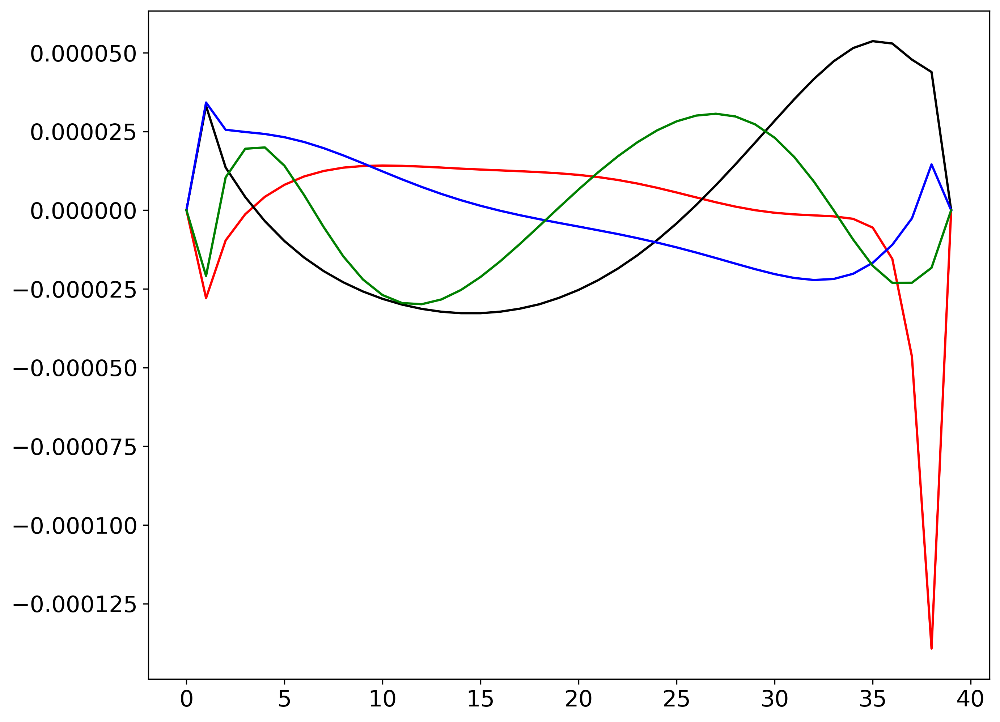

In [11]:
plt.plot(np.diff(np.mean(dsUVEL.UVEL[tin,0,100,:].values,axis=0)),'red')
plt.plot(np.diff(np.mean(dsUVEL.UVEL[tin,20,100,:].values,axis=0)),'k')
plt.plot(np.diff(np.mean(dsUVEL.UVEL[tin,40,100,:].values,axis=0)),'blue')
plt.plot(np.diff(np.mean(dsUVEL.UVEL[tin,47,100,:].values,axis=0)),'green')



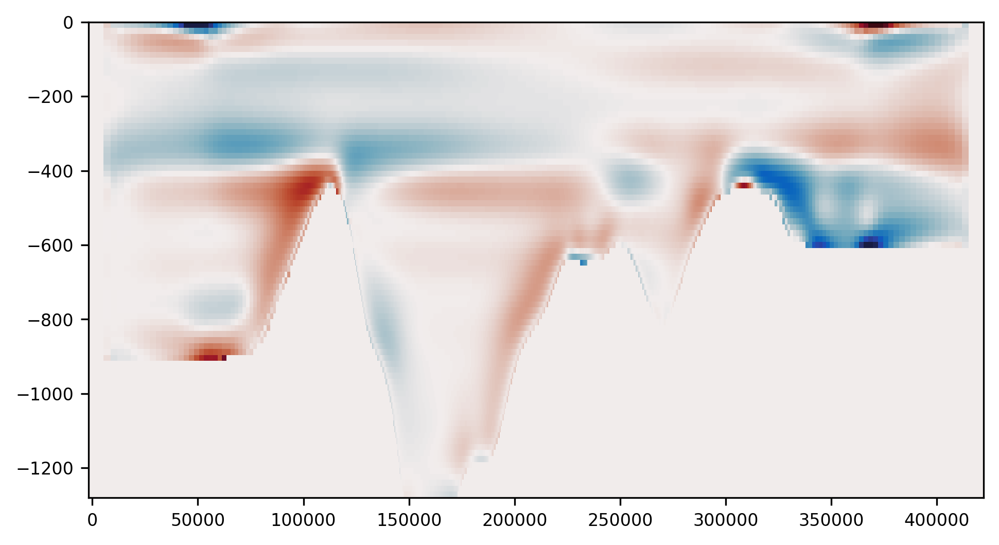

In [158]:
cax=plt.pcolormesh(dsG.Yp1,dsG.Z,np.mean(dsVVEL.VVEL[tin,:,:,20].values,axis=0),vmin=-0.01,vmax=0.01,cmap=cmocean.cm.balance)

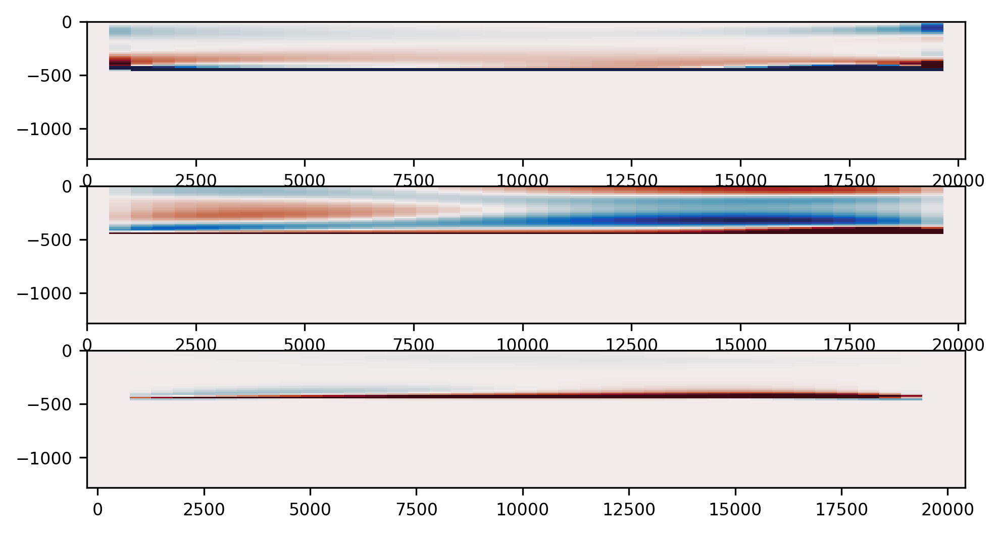

In [165]:
fig,ax=plt.subplots(3)
cax=ax[0].pcolormesh(dsG.X,dsG.Z,np.mean(dsDrag.WVEL[1:3,:,umbral1+2,:].values,axis=0),vmin=-0.00001,vmax=0.00001,cmap=cmocean.cm.balance)
#plt.colorbar(cax=cax)
cax=ax[1].pcolormesh(dsG.X,dsG.Z,np.mean(dsDrag.VVEL[1:3,:,umbral1+2,:].values,axis=0),vmin=-0.01,vmax=0.01,cmap=cmocean.cm.balance)
#plt.colorbar(cax=cax)
cax=ax[2].pcolormesh(dsG.Xp1,dsG.Z,np.mean(dsDrag.UVEL[1:3,:,umbral1+2,:].values,axis=0),vmin=-0.01,vmax=0.01,cmap=cmocean.cm.balance)
#plt.colorbar(cax=cax)

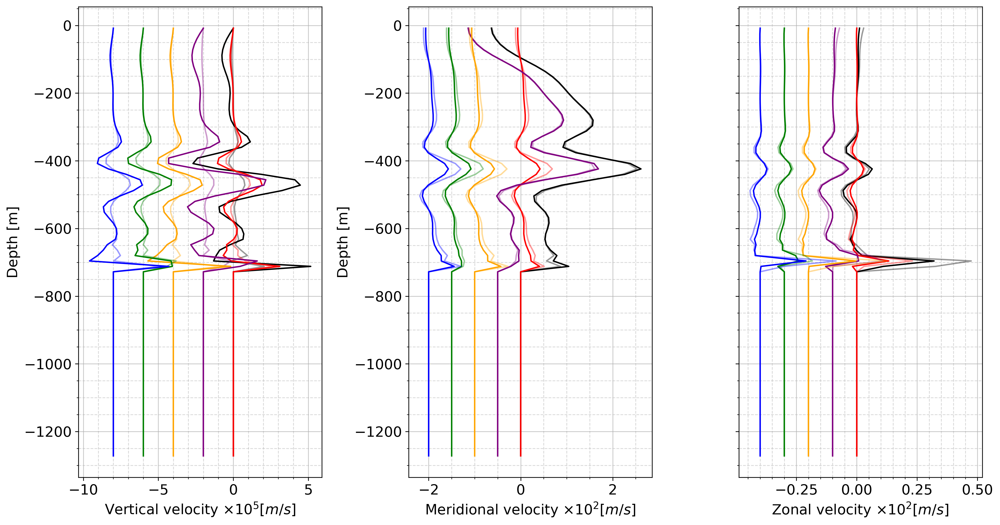

In [22]:
tin=np.arange(0,3,1)
indy=40

fig,ax=plt.subplots(1,3)
axin=ax[0]
d=2
axin.plot(np.mean(dsWVELfree.WVEL[tin,:,indy,1].values,axis=0)*1e5,dsG.Z,'k',label='Free slip')
axin.plot(np.mean(dsWVELfree.WVEL[tin,:,indy,2].values,axis=0)*1e5,dsG.Z,'k',alpha=0.4)

axin.plot(np.mean(dsWVEL.WVEL[tin,:,indy,1].values,axis=0)*1e5,dsG.Z,'red',label='Half slip Sides\nand bottom drag 2e-4')
axin.plot(np.mean(dsWVEL.WVEL[tin,:,indy,2].values,axis=0)*1e5,dsG.Z,'red',alpha=0.4)

axin.plot(np.mean(dsDragBot.WVEL[tin,:,indy,1].values,axis=0)*1e5-d*1,dsG.Z,'purple',label='Bottom drag 1e-3')
axin.plot(np.mean(dsDragBot.WVEL[tin,:,indy,2].values,axis=0)*1e5-d*1,dsG.Z,'purple',alpha=0.4)

axin.plot(np.mean(dsDragSide.WVEL[tin,:,indy,1].values,axis=0)*1e5-d*2,dsG.Z,'orange',label='Half slip Sides')
axin.plot(np.mean(dsDragSide.WVEL[tin,:,indy,2].values,axis=0)*1e5-d*2,dsG.Z,'orange',alpha=0.4)

axin.plot(np.mean(dsDrag.WVEL[tin,:,indy,1].values,axis=0)*1e5-d*3,dsG.Z,'green',label='Half slip Sides\nand bottom drag 1e-3')
axin.plot(np.mean(dsDrag.WVEL[tin,:,indy,2].values,axis=0)*1e5-d*3,dsG.Z,'green',alpha=0.4)

axin.plot(np.mean(dsDragquad.WVEL[tin,:,indy,1].values,axis=0)*1e5-d*4,dsG.Z,'blue',label='Half slip Sides\nand bottom drag 1e-2')
axin.plot(np.mean(dsDragquad.WVEL[tin,:,indy,2].values,axis=0)*1e5-d*4,dsG.Z,'blue',alpha=0.4)

axin.set(xlabel=r'Vertical velocity $\times 10^{5} [m/s]$', ylabel='Depth [m]')
#axin.legend(loc='lower right')

axin.minorticks_on()

axin.grid(which='minor',linestyle='--', alpha=0.5)
axin.grid(which='major',alpha=0.7)

#axin.set_xlim((np.min(np.mean(dsDragquad.UVEL[tin,:,indy,1].values,axis=0)*1e5-d*4),np.max(np.mean(dsUVEL.UVEL[tin,:,indy,1].values,axis=0)*1e5)))
#axin.set_ylim((dsG.Z[np.where(np.mean(dsDragquad.UVEL[tin,:,indy,0].values,axis=0)==np.mean(dsDragquad.UVEL[tin,-1,indy,0].values,axis=0))[0][0]],0))

axin=ax[1]
d=0.5
axin.plot(np.mean(dsVVELfree.VVEL[tin,:,indy,1].values,axis=0)*1e2,dsG.Z,'k',label='Free slip')
axin.plot(np.mean(dsVVELfree.VVEL[tin,:,indy,2].values,axis=0)*1e2,dsG.Z,'k',alpha=0.4)

axin.plot(np.mean(dsVVEL.VVEL[tin,:,indy,1].values,axis=0)*1e2,dsG.Z,'red',label='Half slip Sides\nand bottom drag 2e-4')
axin.plot(np.mean(dsVVEL.VVEL[tin,:,indy,2].values,axis=0)*1e2,dsG.Z,'red',alpha=0.4)

axin.plot(np.mean(dsDragBot.VVEL[tin,:,indy,1].values,axis=0)*1e2-d*1,dsG.Z,'purple',label='Bottom drag 1e-3')
axin.plot(np.mean(dsDragBot.VVEL[tin,:,indy,2].values,axis=0)*1e2-d*1,dsG.Z,'purple',alpha=0.4)

axin.plot(np.mean(dsDragSide.VVEL[tin,:,indy,1].values,axis=0)*1e2-d*2,dsG.Z,'orange',label='Half slip Sides')
axin.plot(np.mean(dsDragSide.VVEL[tin,:,indy,2].values,axis=0)*1e2-d*2,dsG.Z,'orange',alpha=0.4)

axin.plot(np.mean(dsDrag.VVEL[tin,:,indy,1].values,axis=0)*1e2-d*3,dsG.Z,'green',label='Half slip Sides\nand bottom drag 1e-3')
axin.plot(np.mean(dsDrag.VVEL[tin,:,indy,2].values,axis=0)*1e2-d*3,dsG.Z,'green',alpha=0.4)

axin.plot(np.mean(dsDragquad.VVEL[tin,:,indy,1].values,axis=0)*1e2-d*4,dsG.Z,'blue',label='Half slip Sides\nand bottom drag 1e-2')
axin.plot(np.mean(dsDragquad.VVEL[tin,:,indy,2].values,axis=0)*1e2-d*4,dsG.Z,'blue',alpha=0.4)

axin.set(xlabel=r'Meridional velocity $\times 10^{2} [m/s]$', ylabel='Depth [m]')
#axin.legend(loc='lower right')

axin.minorticks_on()

axin.grid(which='minor',linestyle='--', alpha=0.5)
axin.grid(which='major',alpha=0.7)

#axin.set_xlim((np.min(np.mean(dsDragquad.UVEL[tin,:,indy,1].values,axis=0)*1e5-d*4),np.max(np.mean(dsUVEL.UVEL[tin,:,indy,1].values,axis=0)*1e5)))
#axin.set_ylim((dsG.Z[np.where(np.mean(dsDragquad.UVEL[tin,:,indy,0].values,axis=0)==np.mean(dsDragquad.UVEL[tin,-1,indy,0].values,axis=0))[0][0]],0))


d=0.1
axin=ax[2]
axin.plot(np.mean(dsUVELfree.UVEL[tin,:,indy,2].values,axis=0)*1e2,dsG.Z,'k',label='Free slip')
axin.plot(np.mean(dsUVELfree.UVEL[tin,:,indy,3].values,axis=0)*1e2,dsG.Z,'k',alpha=0.4)

axin.plot(np.mean(dsUVEL.UVEL[tin,:,indy,2].values,axis=0)*1e2,dsG.Z,'red',label='Half slip Sides\nand bottom drag 2e-4')
axin.plot(np.mean(dsUVEL.UVEL[tin,:,indy,3].values,axis=0)*1e2,dsG.Z,'red',alpha=0.4)

axin.plot(np.mean(dsDragBot.UVEL[tin,:,indy,2].values,axis=0)*1e2-d*1,dsG.Z,'purple',label='Bottom drag 1e-3')
axin.plot(np.mean(dsDragBot.UVEL[tin,:,indy,3].values,axis=0)*1e2-d*1,dsG.Z,'purple',alpha=0.4)

axin.plot(np.mean(dsDragSide.UVEL[tin,:,indy,2].values,axis=0)*1e2-d*2,dsG.Z,'orange',label='Half slip Sides')
axin.plot(np.mean(dsDragSide.UVEL[tin,:,indy,3].values,axis=0)*1e2-d*2,dsG.Z,'orange',alpha=0.4)

axin.plot(np.mean(dsDrag.UVEL[tin,:,indy,2].values,axis=0)*1e2-d*3,dsG.Z,'green',label='Half slip Sides\nand bottom drag 1e-3')
axin.plot(np.mean(dsDrag.UVEL[tin,:,indy,3].values,axis=0)*1e2-d*3,dsG.Z,'green',alpha=0.4)

axin.plot(np.mean(dsDragquad.UVEL[tin,:,indy,2].values,axis=0)*1e2-d*4,dsG.Z,'blue',label='Half slip Sides\nand bottom drag 1e-2')
axin.plot(np.mean(dsDragquad.UVEL[tin,:,indy,3].values,axis=0)*1e2-d*4,dsG.Z,'blue',alpha=0.4)

axin.set(xlabel=r'Zonal velocity $\times 10^{2} [m/s]$ ')
#axin.legend(ncol=4, bbox_to_anchor=(3, 1.2),fontsize='small')

axin.minorticks_on()

axin.tick_params(axis='y', which='both', left=True, right=False, labelleft=False) 

axin.grid(which='minor',linestyle='--', alpha=0.5)
axin.grid(which='major',alpha=0.7)

#axin.set_xlim((np.min(derivU[0][:,indy,2]*1e6),np.max(derivU[4][:,indy,1]*1e6+d*4)))
#axin.set_ylim((dsG.Z[np.where(derivU[4][:,indy,2]==derivU[4][-1,indy,2])[0][0]],0))
'''
axin=ax[1,1]
d=3
axin.plot(derivV[0][:,indy,1]*1e6,dsG.Z,'k',label='Free slip')
axin.plot(derivV[0][:,indy,2]*1e6,dsG.Z,'k',alpha=0.4)

axin.plot(derivV[1][:,indy,1]*1e6-d,dsG.Z,'purple',label='Bottom drag 1e-3')
axin.plot(derivV[1][:,indy,2]*1e6-d,dsG.Z,'purple',alpha=0.4)

axin.plot(derivV[2][:,indy,1]*1e6-d*2,dsG.Z,'orange',label='Half slip Sides')
axin.plot(derivV[2][:,indy,2]*1e6-d*2,dsG.Z,'orange',alpha=0.4)

axin.plot(derivV[3][:,indy,1]*1e6-d*3,dsG.Z,'green',label='Half slip Sides\nand linear bottom drag 1e-3 m/s')
axin.plot(derivV[3][:,indy,2]*1e6-d*3,dsG.Z,'green',alpha=0.4)

axin.plot(derivV[4][:,indy,1]*1e6-d*4,dsG.Z,'blue',label='Half slip Sides\nand Quadratic bottom drag coef 0.003 m/m')
axin.plot(derivV[4][:,indy,2]*1e6-d*4,dsG.Z,'blue',alpha=0.4)

axin.set(xlabel='Derivative of \n' r' vvel $\times 10^{6} [m/s]$')
#axin.legend(loc='lower right')
axin.minorticks_on()
axin.tick_params(axis='y', which='both', left=True, right=False, labelleft=False) 
axin.grid(which='minor',linestyle='--', alpha=0.5)
axin.grid(which='major',alpha=0.7)
axin.set_xlim((np.min(derivV[4][:,indy,1]*1e6-d*4),np.max(derivV[0][:,indy,2]*1e6)))
axin.set_ylim((dsG.Z[np.where(derivV[4][:,indy,2]==derivV[4][-1,indy,2])[0][0]],0))
'''
fig.tight_layout()
#plt.savefig('../' + str(project)+'/Figures/' + str(ed)+ 'VerticalProfDerivVel.png', bbox_inches='tight')

(array([45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
        62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
        79]),)

In [60]:
ekD=np.sqrt(2*(5*1e-4)/(6.691298637438928e-05))
print(ekD)

3.865848171446193


In [83]:
params = {'font.size': 8,
          'figure.figsize': (20, 8),
         'font.family':'sans'}
pl.rcParams.update(params)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [79]:
closS=0 #int(len(dsG.Y)*0.4)
closE=-1#np.where(dsG.Y>=130000)[0][0] #np.where(dsG.Y>=260000)[0][0]
depS=np.where(dsG.Z>=-400)[0][-1]
depE=np.where(dsG.Z>=-700)[0][-1]

In [80]:
umbral1=np.where(dsG.Depth[:int(ny/2),20].values==np.min(dsG.Depth[:int(ny/2),20].values))[0][int(len(np.where(dsG.Depth[:int(ny/2),20].values==np.min(dsG.Depth[:int(ny/2),20].values))[0])/2)]+1
umbral2=np.where(dsG.Depth[int(ny/2):-int(ny/4),20].values==np.min(dsG.Depth[int(ny/2):-int(ny/4),20].values))[0][int(len(np.where(dsG.Depth[int(ny/2):-int(ny/4),20].values==600)[0])/2)]+int(ny/2)+1
umbral3=np.where(dsG.Depth[-int(ny/4):,20].values==np.min(dsG.Depth[-int(ny/4):,20].values))[0][0]+(len(dsG.Depth[:,0])-int(ny/4))-10


umbralEnd1=np.where(dsG.Depth[:int(ny/2),20]==np.max(dsG.Depth[:int(ny/2),20]))[0][0]
umbralEnd2=np.where(dsG.Depth[int(ny/2):,20]<np.max(dsG.Depth[int(ny/2):,20]))[0][-1]+int(ny/2)

In [81]:
listDs=[dsWVEL,dsDragBot,dsDragSide,dsDrag,dsDragquad]
figname=['freeslip','dragBotLin','dragHalfSide','HalfSideBotLin','HalfSideBotQuad']
title=['Free-slip','Linear bottom drag 1e-3 m/s','Side wall half slip','Linear bottom drag 1e-3 m/s and side wall half slip','Side wall half slip and quadratic bottom drag 0.003 m/m']

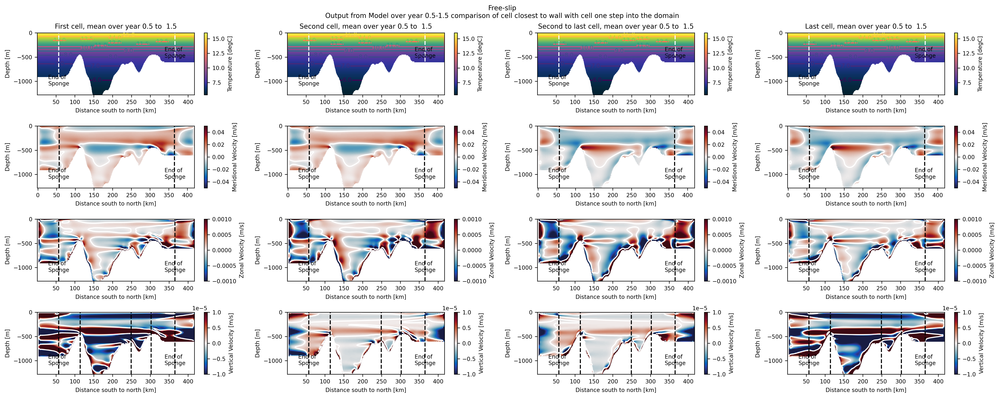

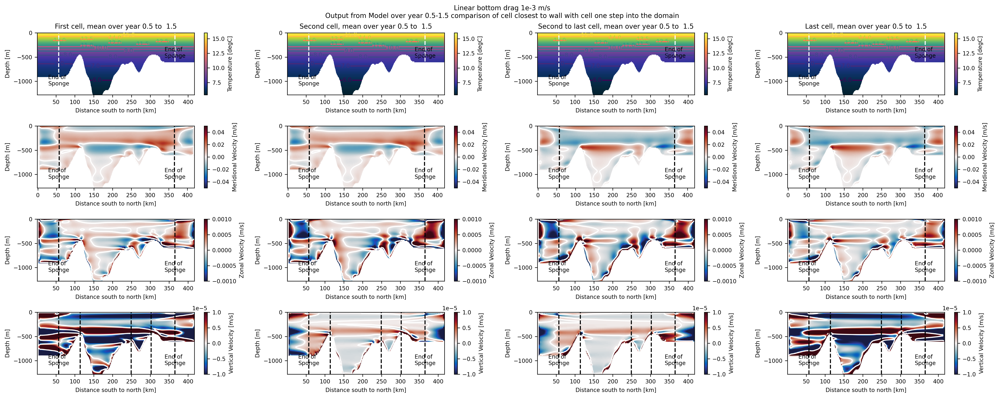

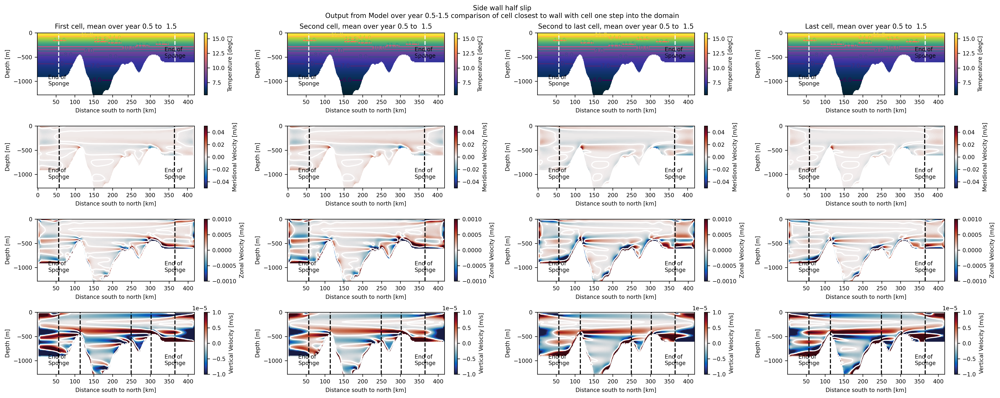

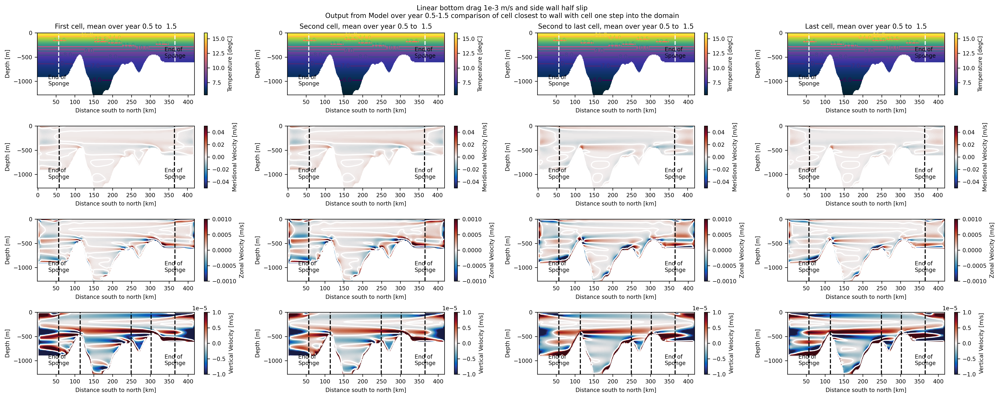

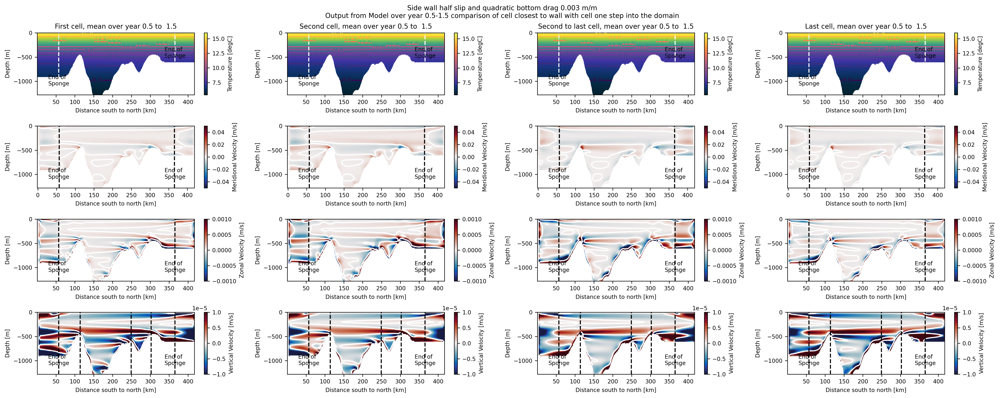

In [84]:
indX=1 #-2#1 #int(nx/2)
indXU=2
tin=np.arange(0,3,1)
indsX=[1,2,-3,-2]
indsXU=[2,3,-4,-3]

titles=['First','Second','Second to last', 'Last']
for m in range(len(listDs)):
    if m==0: 
        dsTHETAin=ds
        dsUVELin=dsUVEL
        dsVVELin=dsVVEL
        dsWVELin=dsWVEL
    else: 
        dsTHETAin=listDs[m]
        dsUVELin=listDs[m]
        dsVVELin=listDs[m]
        dsWVELin=listDs[m]
    
    fig,ax=plt.subplots(4,4)
    for i in range(len(indsX)):
        indX=indsX[i]
        indXU=indsXU[i]
        
        vmin=np.min(np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]))
        vmax=np.max(np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]))
        
        axin=ax[0,i]
        cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsTHETAin.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),vmin=vmin,vmax=vmax,cmap=cmocean.cm.thermal)
        levels=[6,7,8,9,10,11,11.5,12,12.5,13,13.5,14,15]
        caxC=axin.contour(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsTHETAin.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),levels=levels)
        axin.clabel(caxC, inline=1, fontsize=8)
        
        axin.axvline(dsG.Y[OB]/1000,c='white',linestyle='dashed')
        axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        axin.axvline(dsG.Y[OBend]/1000,c='white',linestyle='dashed')
        axin.text(0.81, 0.6, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        axin.set_title(f'{titles[i]} cell, mean over year {ds.T[tin[0]].values/(3600*24*360)} to  {ds.T[tin[-1]].values/(3600*24*360)}')
        
        axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
            
        cbar=plt.colorbar(cax)
        cbar.set_label('Temperature [degC]')
        
        axin=ax[1,i]
        cax=axin.pcolormesh(dsG.Yp1[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsVVELin.VVEL[tin,:,closS:closE,indX],axis=0),mask=masks[:,closS:closE,indX]),vmin=-0.05,vmax=0.05,cmap=cmocean.cm.balance)
        axin.contour(dsG.Yp1[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsVVELin.VVEL[tin,:,closS:closE,indX],axis=0),mask=masks[:,closS:closE,indX]),levels=[0],colors='white')
        axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
        
        axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
        axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
        axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        
        cbar=plt.colorbar(cax)
        cbar.set_label('Meridional Velocity [m/s]')
        
        axin=ax[2,i]
        cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsUVELin.UVEL[tin,:,closS:closE,indXU],axis=0),mask=maskw[:,closS:closE,indXU]),vmin=-0.001,vmax=0.001,cmap=cmocean.cm.balance)
        axin.contour(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsUVELin.UVEL[tin,:,closS:closE,indXU],axis=0),mask=maskw[:,closS:closE,indXU]),levels=[0],colors='white')
        axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
        
        axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
        axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
        axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        
        cbar=plt.colorbar(cax)
        cbar.set_label('Zonal Velocity [m/s]')
        
        axin=ax[3,i]
        cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsWVELin.WVEL[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),vmin=-0.00001,vmax=0.00001,cmap=cmocean.cm.balance)
        axin.contour(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(dsWVELin.WVEL[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),levels=[0],colors='white')
        
        axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
        axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
        axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
            transform=axin.transAxes,fontsize=8)
        
        axin.axvline(dsG.Y[umbral1]/1000,c='black',linestyle='dashed')
        axin.axvline(dsG.Y[umbral2]/1000,c='black',linestyle='dashed')
        axin.axvline(dsG.Y[umbral3]/1000,c='black',linestyle='dashed')
        cbar=plt.colorbar(cax)
        cbar.set_label('Vertical Velocity [m/s]')
        axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
    
    fig.suptitle(str(title[m]) + f'\nOutput from Model over year {ds.T[tin[0]].values/(3600*360*24)}-{ds.T[tin[-1]].values/(3600*360*24)} comparison of cell closest to wall with cell one step into the domain')
    fig.tight_layout() 
    
    plt.savefig('../' + str(project)+'/Figures/' + str(ed)+ 'ComparisonCells' + str(figname[m]) + '.png', bbox_inches='tight')

In [34]:
dudx=(np.mean(dsUVEL.UVEL[tin,:,closS:closE,1:].values,axis=0)-np.mean(dsUVEL.UVEL[tin,:,closS:closE,:-1].values,axis=0))/(dsG.Xp1[1:].values-dsG.Xp1[:-1].values)
dvdy=(np.mean(dsVVEL.VVEL[tin,:,:-1,:].values,axis=0)-np.mean(dsVVEL.VVEL[tin,:,1:,:].values,axis=0))/(dsG.Yp1[:-1].values-dsG.Yp1[1:].values)[None,:,None]
dwdz=(np.mean(dsWVEL.WVEL[tin,:-1,closS:closE,:].values,axis=0)-np.mean(dsWVEL.WVEL[tin,1:,closS:closE,:].values,axis=0))/(dsG.Z[:-1].values-dsG.Z[1:].values)[:,None,None]



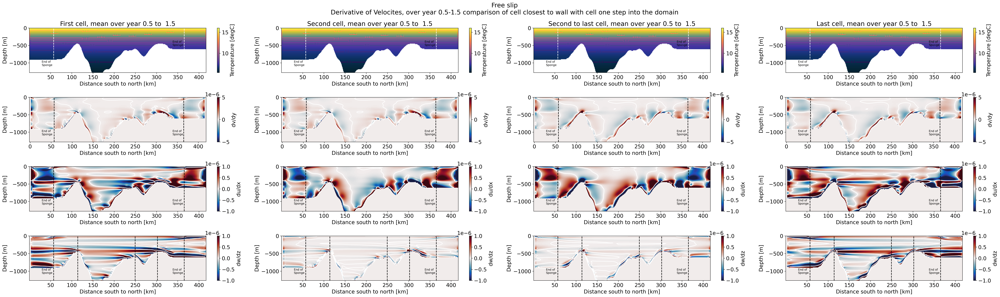

In [79]:
indX=1 #-2#1 #int(nx/2)
indXU=2
tin=np.arange(0,3,1)
indsX=[1,2,3,-3,-2]
indsXU=[1,2,3,-4,-3,-2]

titles=['First','Second','Second to last', 'Last']
k=0
fig,ax=plt.subplots(4,4)
for i in [0,1,3,4]:
    indX=indsX[i]
    indXU=indsXU[i]
    
    vmin=np.min(np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]))
    vmax=np.max(np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]))

    axin=ax[0,k]
    cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),vmin=vmin,vmax=vmax,cmap=cmocean.cm.thermal)
    levels=[6,7,8,9,10,11,11.5,12,12.5,13,13.5,14,15]
    caxC=axin.contour(dsG.Y[closS:closE]/1000,dsG.Z,np.ma.masked_array(np.mean(ds.THETA[tin,:,closS:closE,indX],axis=0),mask=mask[:,closS:closE,indX]),levels=levels)
    axin.clabel(caxC, inline=1, fontsize=8)
    
    axin.axvline(dsG.Y[OB]/1000,c='white',linestyle='dashed')
    axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    axin.axvline(dsG.Y[OBend]/1000,c='white',linestyle='dashed')
    axin.text(0.81, 0.6, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    axin.set_title(f'{titles[k]} cell, mean over year {ds.T[tin[0]].values/(3600*24*360)} to  {ds.T[tin[-1]].values/(3600*24*360)}')
    
    axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
        
    cbar=plt.colorbar(cax)
    cbar.set_label('Temperature [degC]')
    
    axin=ax[1,k]
    cax=axin.pcolormesh(dsG.Yp1[:-1]/1000,dsG.Z,dvdy[:,:,indX],vmin=-0.000005,vmax=0.000005,cmap=cmocean.cm.balance)
    axin.contour(dsG.Yp1[:-1]/1000,dsG.Z,dvdy[:,:,indX],levels=[0],colors='white')
    axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
    
    axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
    axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
    axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    
    cbar=plt.colorbar(cax)
    cbar.set_label('dv/dy')
    
    axin=ax[2,k]
    cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z,dudx[:,:,indX],vmin=-0.000001,vmax=0.000001,cmap=cmocean.cm.balance)
    axin.contour(dsG.Y[closS:closE]/1000,dsG.Z,dudx[:,:,indX],levels=[0],colors='white')
    axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
    
    axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
    axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
    axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    
    cbar=plt.colorbar(cax)
    cbar.set_label('du/dx')
    
    axin=ax[3,k]
    
    cax=axin.pcolormesh(dsG.Y[closS:closE]/1000,dsG.Z[:-1],dwdz[:,:,indX],vmin=-0.000001,vmax=0.000001,cmap=cmocean.cm.balance)
    axin.contour(dsG.Y[closS:closE]/1000,dsG.Z[:-1],dwdz[:,:,indX],levels=[0],colors='white')
    
    axin.axvline(dsG.Y[OB]/1000,c='black',linestyle='dashed')
    axin.text(0.07, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    axin.axvline(dsG.Y[OBend]/1000,c='black',linestyle='dashed')
    axin.text(0.81, 0.15, 'End of \nSponge', color='black', 
        transform=axin.transAxes,fontsize=8)
    
    axin.axvline(dsG.Y[umbral1]/1000,c='black',linestyle='dashed')
    axin.axvline(dsG.Y[umbral2]/1000,c='black',linestyle='dashed')
    axin.axvline(dsG.Y[umbral3]/1000,c='black',linestyle='dashed')
    cbar=plt.colorbar(cax)
    cbar.set_label('dw/dz')
    axin.set(xlabel='Distance south to north [km]',ylabel='Depth [m]')
    k=k+1
    


fig.suptitle(f'Free slip\nDerivative of Velocites, over year {ds.T[tin[0]].values/(3600*24*360)}-{ds.T[tin[-1]].values/(3600*24*360)} comparison of cell closest to wall with cell one step into the domain')
fig.tight_layout() 
plt.savefig('../' + str(project)+'/Figures/' + str(ed)+ 'ComparisonDerivatives.png', bbox_inches='tight')

In [104]:
listDs=[dsWVEL,dsDragBot,dsDragSide,dsDrag,dsDragquad]
figname=['freeslip','dragBotLin','dragHalfSide','HalfSideBotLin','HalfSideBotQuad']
title=['Free-slip','Linear bottom drag 1e-3 m/s','Side wall half slip','Linear bottom drag 1e-3 m/s\nand side wall\nhalf slip','Side wall half slip and\nquadratic bottom\ndrag 0.003 m/m']

In [105]:
params = {'font.size': 8,
          'figure.figsize': (7.48, 4),
         'font.family':'sans'}
pl.rcParams.update(params)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

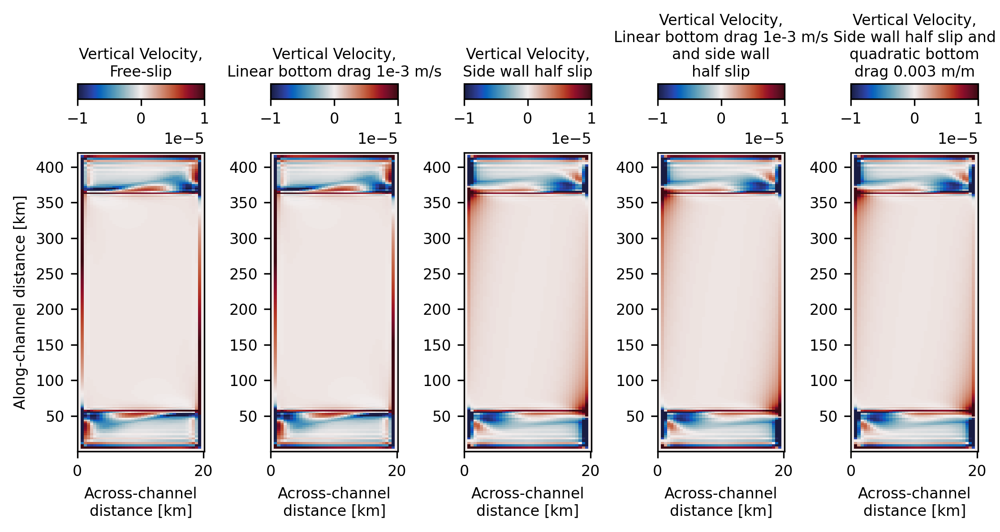

In [110]:
fig,ax=plt.subplots(1,5)
vmax=0.00001
vmin=-0.00001
tin=1
dep=1

cax=ax[0].pcolormesh(dsG.X/1000,dsG.Y/1000,listDs[0].WVEL[tin,dep,:,:].values,vmin=vmin,vmax=vmax,cmap=cmocean.cm.balance)

divider = make_axes_locatable(ax[0])
axdiv = divider.new_vertical(size = '5%', pad = 0.4)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
cbar_ax.set_label('Vertical Velocity,\n' + str(title[0]))

cax2=ax[1].pcolormesh(dsG.X/1000,dsG.Y/1000,listDs[1].WVEL[tin,dep,:,:].values,vmin=vmin,vmax=vmax,cmap=cmocean.cm.balance)

divider = make_axes_locatable(ax[1])
axdiv = divider.new_vertical(size = '5%', pad = 0.4)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax2, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
cbar_ax.set_label('Vertical Velocity,\n'+ str(title[1]))

cax1=ax[2].pcolormesh(dsG.X/1000,dsG.Y/1000,listDs[2].WVEL[tin,dep,:,:].values,vmin=vmin,vmax=vmax,cmap=cmocean.cm.balance)

divider = make_axes_locatable(ax[2])
axdiv = divider.new_vertical(size = '5%', pad = 0.4)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax1, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
cbar_ax.set_label('Vertical Velocity,\n'+ str(title[2]))

cax2=ax[3].pcolormesh(dsG.X/1000,dsG.Y/1000,listDs[3].WVEL[tin,dep,:,:].values,vmin=vmin,vmax=vmax,cmap=cmocean.cm.balance)

divider = make_axes_locatable(ax[3])
axdiv = divider.new_vertical(size = '5%', pad = 0.4)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax2, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
cbar_ax.set_label('Vertical Velocity,\n'+ str(title[3]))


cax2=ax[4].pcolormesh(dsG.X/1000,dsG.Y/1000,listDs[4].WVEL[tin,dep,:,:].values,vmin=vmin,vmax=vmax,cmap=cmocean.cm.balance)

divider = make_axes_locatable(ax[4])
axdiv = divider.new_vertical(size = '5%', pad = 0.4)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax2, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
cbar_ax.set_label('Vertical Velocity,\n'+ str(title[4]))




ax[0].set(xlabel='Across-channel\ndistance [km]',ylabel='Along-channel distance [km]')
ax[1].set(xlabel='Across-channel\ndistance [km]')
ax[2].set(xlabel='Across-channel\ndistance [km]')
ax[3].set(xlabel='Across-channel\ndistance [km]')
ax[4].set(xlabel='Across-channel\ndistance [km]')
fig.tight_layout()
plt.savefig('../' + str(project)+'/Figures/' + str(ed)+ 'dep1.png', bbox_inches='tight')

In [113]:
dsG.Z[1]

<xarray.DataArray 'Z' ()> Size: 8B
array(-24.)
Coordinates:
    Z        float64 8B -24.0
Attributes:
    long_name:  vertical coordinate of cell center
    units:      meters
    positive:   up